In [17]:
%matplotlib inline

import datetime
import os
from glob import glob

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patheffects as pe
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import pandas as pd
import tqdm.notebook as tqdm
import warnings

from progressbar import *
import progressbar as pbar
from obspy import UTCDateTime, read
from obspy.clients.fdsn import Client
from obspy.clients.fdsn.client import FDSNNoDataException
from obspy.signal import PPSD
from obspy.signal.spectral_estimation import get_nlnm, get_nhnm
from obspy.imaging.cm import pqlx
from obspy import read, read_inventory
from obspy import realtime
from obspy.core import UTCDateTime
from obspy.core import stream
from obspy.core.stream import Stream
from obspy.core import trace
from obspy.core.trace import Trace
from obspy.core.trace import Stats
from obspy.signal import polarization,freqattributes
from obspy.signal.cross_correlation import correlate,correlate_template
from obspy.signal.cross_correlation import correlation_detector
from obspy.signal.detrend import polynomial, spline
from obspy.signal.trigger import trigger_onset, classic_sta_lta, plot_trigger, ar_pick


import scipy.io
from scipy.fftpack import fft, ifft
from scipy.signal import welch, stft, spectrogram
from scipy.ndimage.filters import gaussian_filter
from scipy.signal import hilbert, tukey

%load_ext autoreload
%autoreload 2
from seismic_noise import *
import seismosocialdistancing
from datetime import datetime

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
### Paramètres généraux
load_data = False              # Recalculer les PPSDs et le déplacement RMS
freqs = [(2.0,8.0)]          # Bandes de fréquences à étudier 
st_name = ["G.CCD.00.BHZ"]  # Station à étudier
time_zone = "Europe/Brussels"
noise_input_data = "C:/Users/Arnaud/Desktop/Seismic_noise/PDR/SeismicNoiseData"
PPSD_FOLDER  = "C:/Users/Arnaud/Desktop/Seismic_noise/PDR/SeismicNoiseData/PPSD"
DRMS_FOLDER  = "C:/Users/Arnaud/Desktop/Seismic_noise/PDR/SeismicNoiseData/DRMS"
MSEED_FOLDER = "C:/Users/Arnaud/Desktop/Seismic_noise/PDR/SeismicNoiseData/MSEED"
timeseries_data = "Files/noise_timeseries/"
start = UTCDateTime("2010-01-01")    # Start Time
end = UTCDateTime("2020-12-31")      # End Time
datelist = pd.date_range(start.datetime, min(end, UTCDateTime()).datetime, freq="D")

In [48]:
tEnd = '2021-10-29'
name="G.CCD.00.BHZ"
tStart = '2010-01-01'
folder='C:/Users/Arnaud/Desktop/test'

datelist = pd.date_range(start=UTCDateTime(tStart).datetime,end=UTCDateTime(tEnd).datetime)

for k in range (len(datelist)):
    try:
        z=str(datelist[k])
        z=z[0:10]
        st=read("{}/{}/{}_{}.mseed".format(MSEED_FOLDER,name,z,name))
        st.trim(starttime=UTCDateTime(datelist[k]),endtime=UTCDateTime(datelist[k+1]))
        st.write("{}/{}_{}.mseed".format(folder,z,name))
    except:
        pass


C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\headers.py:828: InternalMSEEDWarning: readMSEEDBuffer(): Not a SEED record. Will skip bytes 24576 to 24703.
  warnings.warn(_w, InternalMSEEDWarning)
C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\headers.py:828: InternalMSEEDWarning: readMSEEDBuffer(): Not a SEED record. Will skip bytes 24704 to 24831.
  warnings.warn(_w, InternalMSEEDWarning)
C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\headers.py:828: InternalMSEEDWarning: readMSEEDBuffer(): Not a SEED record. Will skip bytes 24832 to 24959.
  warnings.warn(_w, InternalMSEEDWarning)
C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\headers.py:828: InternalMSEEDWarning: readMSEEDBuffer(): Not a SEED record. Will skip bytes 24960 to 25087.
  warnings.warn(_w, InternalMSEEDWarning)
C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\headers.py:828: InternalMSEEDWarning: readMSEEDBuffer(): Not a SE

C:\Users\Arnaud\.conda\envs\obspy\lib\site-packages\obspy\io\mseed\core.py:840: UserWarning: File will be written with more than one different record lengths.
This might have a negative influence on the compatibility with other programs.
  warnings.warn(msg % 'record lengths')


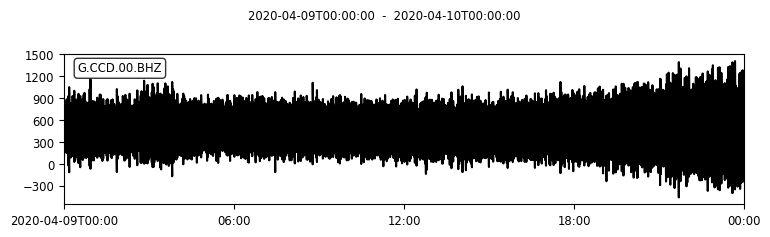

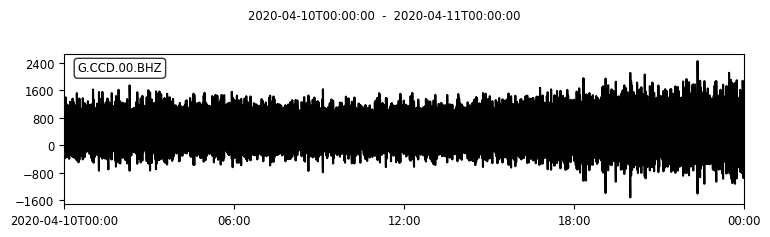

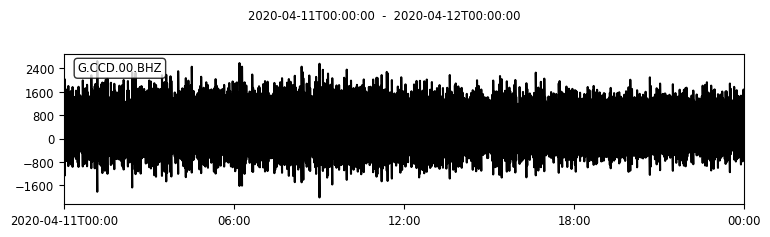

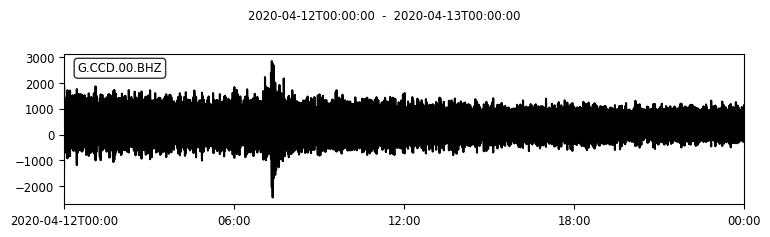

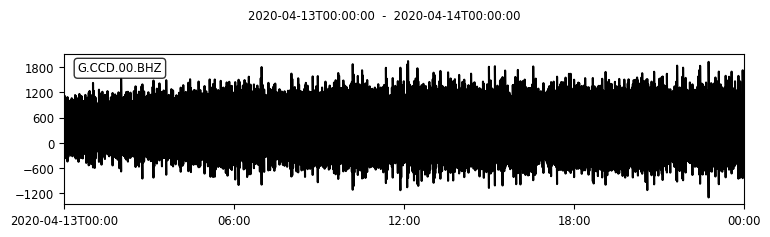

...

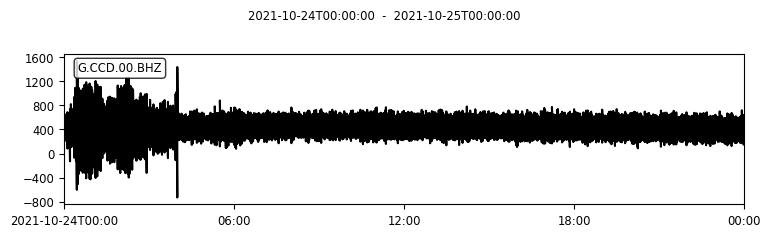

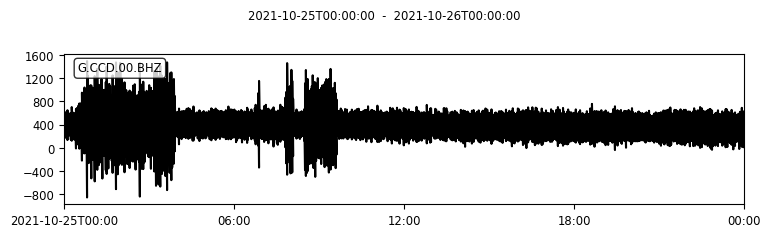

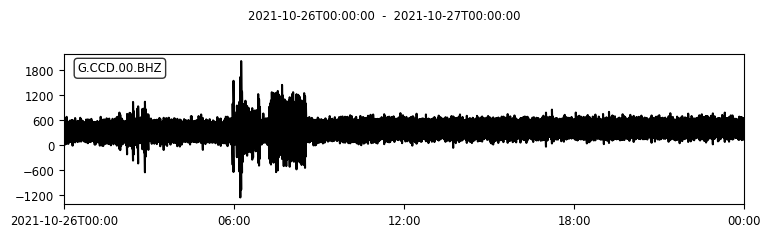

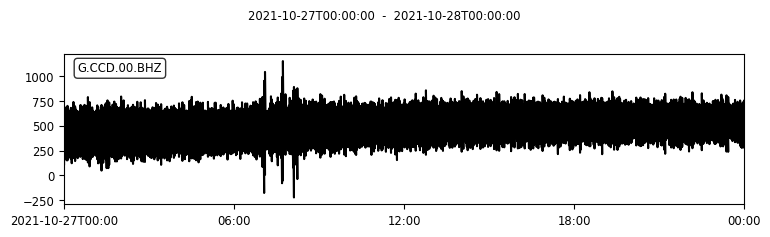

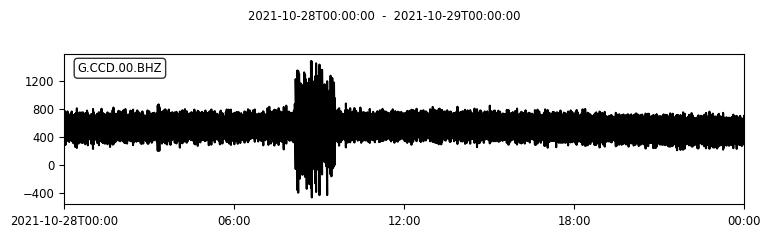

In [47]:
tEnd = '2021-10-29'
name="G.CCD.00.BHZ"
tStart = '2020-04-09'

datelist = pd.date_range(start=UTCDateTime(tStart).datetime,end=UTCDateTime(tEnd).datetime)

for k in range (len(datelist)):
    try:
        z=str(datelist[k])
        z=z[0:10]
        st=read("{}/{}_{}.mseed".format(folder,z,name))
    except:
        pass